**Owner's Name**: Nitin Faye

##Problem Statement

Description:
Predict the levels of CO, NO, PM10 and PM2.5 in Central London for the next 30 minutes (by utilising historical data) and highlight any outliers. Also, allow the user to specify a threshold for each of the metrics.
A possible source of data could be the follow: http://www.londonair.org.uk/LondonAir/API/, feel free to use any other related dataset regarding air pollution.
The emphasis is on *how* you develop a solution that could be further improved by another member of the team. Bear in mind that the code will be QA'ed by a member of the tech team.
Ideally, the solution would be developed in such a way that the end-user could see the results by using a single script (e.g., a jupyter notebook)
Finally, please share the link of the repository of your choice. Please avoid any descriptions that will refer back to Conigital on the public description.

#Deliveries :
•	Comments on Code

•	Small Report explaining why the implemented algorithms were selected. 

•	Code Repo with full Git logs

•	Code as script or Jupyter notebook commented 

•	Unit tests 

•	Future work and improvements


## Data collection
* **dataCO. csv** this csv file download from the london.air api from date 1-jan2010 to 1-april 2010 with 15 min calculation. using these old data because currert date data is not available  In tihs dataset 3 month value of carban monoxide.
* **dataNO.csv** In this dataset value of Nitric monoxide with city of london is availble and download  from date 1-jan 2020 to 1-april 2020.
* **datapm10** In this dataset the value of particular matter measured with 10 parameter dataset from 1-jan2020 to 1-april 2020
* **datapm25*** It representes the value of particular matter measured with 2.5 parameter. dataset from 1-jan2020 to 1-april 2020

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime



/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
df_co = pd.read_csv("/content/dataCO.csv",encoding= 'unicode_escape')
df_no = pd.read_csv("/content/data NO.csv",encoding= 'unicode_escape')
df_pm10 = pd.read_csv("/content/dataPM10.csv",encoding= 'unicode_escape')
df_pm25 = pd.read_csv("/content/dataPM2.5.csv",encoding= 'unicode_escape')


In [ ]:
df_co.tail()

,Site,Species,ReadingDateTime,Value,Units,Provisional or Ratified
8635,CT6,CO,31/03/2010 22:45,0.3,ppm,R
8636,CT6,CO,31/03/2010 23:00,0.3,ppm,R
8637,CT6,CO,31/03/2010 23:15,0.3,ppm,R
8638,CT6,CO,31/03/2010 23:30,0.2,ppm,R
8639,CT6,CO,31/03/2010 23:45,0.3,ppm,R


In [ ]:
df_no.head()

,Site,Species,ReadingDateTime,Value,Units,Provisional or Ratified
0,CT4,NO,01/01/2020 00:00,11.1,ppb,P
1,CT4,NO,01/01/2020 00:15,20.5,ppb,P
2,CT4,NO,01/01/2020 00:30,33.5,ppb,P
3,CT4,NO,01/01/2020 00:45,51.3,ppb,P
4,CT4,NO,01/01/2020 01:00,19.9,ppb,P


In [ ]:
df_pm10.head()

,Site,Species,ReadingDateTime,Value,Units,Provisional or Ratified
0,CT4,PM10,01/01/2020 00:00,35.3,ug m-3 reference equiv by VCM,P
1,CT4,PM10,01/01/2020 00:15,36.6,ug m-3 reference equiv by VCM,P
2,CT4,PM10,01/01/2020 00:30,36.6,ug m-3 reference equiv by VCM,P
3,CT4,PM10,01/01/2020 00:45,40.1,ug m-3 reference equiv by VCM,P
4,CT4,PM10,01/01/2020 01:00,42.8,ug m-3 reference equiv by VCM,P


In [ ]:
df_pm25.head()

,Site,Species,ReadingDateTime,Value,Units,Provisional or Ratified
0,CT2,PM2.5,01/01/2020 00:00,34.0,ug/m3,P
1,CT2,PM2.5,01/01/2020 00:15,34.0,ug/m3,P
2,CT2,PM2.5,01/01/2020 00:30,34.0,ug/m3,P
3,CT2,PM2.5,01/01/2020 00:45,34.0,ug/m3,P
4,CT2,PM2.5,01/01/2020 01:00,45.0,ug/m3,P


* **Site** : City of London that recorded the data.
* **Species** : It indicate the all element available in pollution
* **ReadingDateTime**  :Indicate the time with 15 min.of every days 
* **value** :The value of area where the measurement was made.
* **Units** : reference equiv by ug/mg
* **CO**  : The amount of carbon dioxide measured
* **NO** : The amount of Nitric monoxide measured
* **PM10** : It representes the value of particular matter measured.
* **PM2.5** :It represents the value of particulate matter measured.
* **Provisional or Ratified** :It indicates P and R of parameter area.
* **CT1** :- City of London-Beech Street
* **CT2** :- City of LOndon- Farringdon Street
* **CT3** :- City of london- Senator House
* **CT4** :- City of London - Sir jhon Cass School
* **CT5** :- City of London - Upper Thames Street
* **CT6** :- City of London - Whalbrook Wharf


In [ ]:
# shape of all dataset
print("shape of carbon monoxide")
print(df_co.shape)
print('shape of nitric oxide')
print(df_no.shape)
print('shape of particular matter measured')
print(df_pm10.shape)
print('shape of particular matter measured')
print(df_pm25.shape)

shape of carbon monoxide
(8640, 6)
shape of nitric oxide
(52416, 6)
shape of particular matter measured
(34944, 6)
shape of particular matter measured
(17472, 6)


In [ ]:
print (df_co.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8640 entries, 0 to 8639
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Site                     8640 non-null   object 
 1   Species                  8640 non-null   object 
 2   ReadingDateTime          8640 non-null   object 
 3   Value                    6561 non-null   float64
 4   Units                    8640 non-null   object 
 5   Provisional or Ratified  8640 non-null   object 
dtypes: float64(1), object(5)
memory usage: 405.1+ KB
None


In [ ]:
print(df_no.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52416 entries, 0 to 52415
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Site                     52416 non-null  object 
 1   Species                  52416 non-null  object 
 2   ReadingDateTime          52416 non-null  object 
 3   Value                    33435 non-null  float64
 4   Units                    52416 non-null  object 
 5   Provisional or Ratified  52416 non-null  object 
dtypes: float64(1), object(5)
memory usage: 2.4+ MB
None


In [ ]:
print(df_pm10.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34944 entries, 0 to 34943
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Site                     34944 non-null  object 
 1   Species                  34944 non-null  object 
 2   ReadingDateTime          34944 non-null  object 
 3   Value                    24769 non-null  float64
 4   Units                    34944 non-null  object 
 5   Provisional or Ratified  34944 non-null  object 
dtypes: float64(1), object(5)
memory usage: 1.6+ MB
None


In [ ]:
print(df_pm25.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17472 entries, 0 to 17471
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Site                     17472 non-null  object 
 1   Species                  17472 non-null  object 
 2   ReadingDateTime          17472 non-null  object 
 3   Value                    15417 non-null  float64
 4   Units                    17472 non-null  object 
 5   Provisional or Ratified  17472 non-null  object 
dtypes: float64(1), object(5)
memory usage: 819.1+ KB
None


# EDA

## Null Values

In [ ]:
def printNullValues(df):
    total = df.copy()
    total = df.isnull().sum().sort_values(ascending = False)
    total = total[df.isnull().sum().sort_values(ascending = False) != 0]
    percent = total / len(df_co) * 100
    percent = percent[df.isnull().sum().sort_values(ascending = False) != 0]
    concat = pd.concat([total, percent], axis=1, keys=['Total','Percent'])
    print (concat)
    print ( "-------------")
    return total

In [ ]:
print('percentage of carbon monoxide')
co_perc = printNullValues(df_co)
print('percentage of nitric oxide')
no_perc = printNullValues(df_no)
print('percentage of  particular matter measured 10')
pm10_perc = printNullValues(df_pm10)
print('percentage of  particular matter measured2.5')
pm_25perc =printNullValues(df_pm25)


percentage of carbon monoxide
       Total  Percent
Value   2079  24.0625
-------------
percentage of nitric oxide
       Total   Percent
Value  18981  219.6875
-------------
percentage of  particular matter measured 10
       Total     Percent
Value  10175  117.766204
-------------
percentage of  particular matter measured2.5
       Total    Percent
Value   2055  23.784722
-------------


## Site

In [ ]:
df_co["Site"].value_counts()
df_no["Site"].value_counts()
df_pm10["Site"].value_counts()
df_pm25["Site"].value_counts()


CT3    8736
CT2    8736
Name: Site, dtype: int64

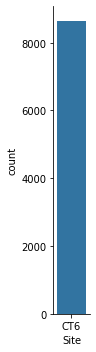

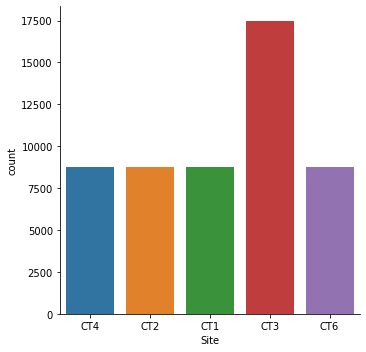

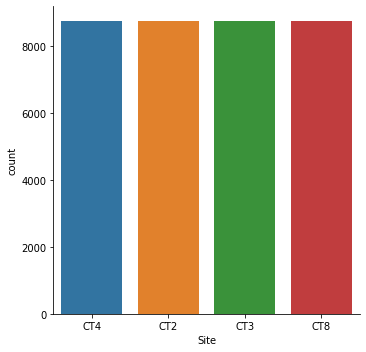

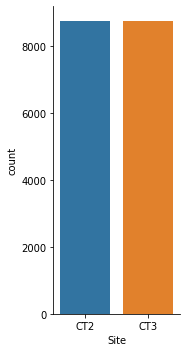

In [ ]:
sns.catplot(x = "Site", kind = "count",  data = df_co, height=5, aspect = 0.25)
sns.catplot(x = "Site", kind = "count",  data = df_no, height=5, aspect = 1)
sns.catplot(x = "Site", kind = "count",  data = df_pm10, height=5, aspect = 1)
sns.catplot(x = "Site", kind = "count",  data = df_pm25, height=5, aspect = 0.5)


## Data visualization

In [ ]:
import plotly
import plotly.graph_objects as go
import plotly.express as px
plotly.io.renderers.default = 'colab'

In [ ]:
#Total carbon monoxide
fig = px.bar(df_co, x="ReadingDateTime", y="Value", color='Value', orientation='v', height=600,
             title='Carbon monoxide ', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

#Total Nitric oxide 
fig = px.bar(df_no, x="ReadingDateTime", y="Value", color='Value', orientation='v', height=600,
             title='Nitric oxide', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

#Total particular matter measured in 10
fig = px.bar(df_pm10, x="ReadingDateTime", y="Value", color='Value', orientation='v', height=600,
             title='particular matter measured 10', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()
# total particular matter measured in2.5
fig = px.bar(df_pm25, x="ReadingDateTime", y="Value", color='Value', orientation='v', height=600,
             title='particular matter measured 2.5', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

In [ ]:
fig = go.Figure()
#Plotting 15 minutes per value of carbon monoxide
fig.add_trace(go.Scatter(x=df_co['ReadingDateTime'], y=df_co['Value'], mode='lines+markers', name='Carbon monoxide',line=dict(color='blue', width=2)))
fig.update_layout(title='Air pollution of carbon monoxide in city London', xaxis_tickfont_size=14,yaxis=dict(title='value of carbon monoxide'))

fig.show()

In [ ]:
fig = go.Figure()
#Plotting for 15 minutes value of Nitric oxide
fig.add_trace(go.Scatter(x=df_no['ReadingDateTime'], y=df_no['Value'], mode='lines+markers', name='nitric Oxide', line=dict(color='Red', width=2)))
fig.update_layout(title='Air pollution of nitric oxide in city London', xaxis_tickfont_size=14,yaxis=dict(title='Number of Species'))

fig.show()

In [ ]:
fig = go.Figure()
#Plotting 15 min of PM 10  values
fig.add_trace(go.Scatter(x=df_pm10['ReadingDateTime'], y=df_pm10['Value'], mode='lines+markers', name='particular matter measured10', line=dict(color='Green', width=2)))

fig.update_layout(title='Air pollution ofparticular matter measured 10 in city London', xaxis_tickfont_size=14,yaxis=dict(title='Number of Species'))

fig.show()

In [ ]:
fig = go.Figure()
#Plotting daily 15 min PM2.5 values
fig.add_trace(go.Scatter(x=df_pm25['ReadingDateTime'], y=df_pm25['Value'], mode='lines+markers', name='particular matter measured2.5',line=dict(color='orange', width=2)))

fig.update_layout(title='Air pollution of particular matter measured 2.5 in city London', xaxis_tickfont_size=14,yaxis=dict(title='Number of Species'))

fig.show()

In [ ]:
fig = go.Figure()
#Plotting for comparism of species in high value
fig.add_trace(go.Scatter(x=df_no['ReadingDateTime'], y=df_no['Value'], mode='lines+markers', name='nitric Oxide', line=dict(color='Red', width=2)))
fig.add_trace(go.Scatter(x=df_pm10['ReadingDateTime'], y=df_pm10['Value'], mode='lines+markers', name='particular matter measured10', line=dict(color='Green', width=2)))
fig.add_trace(go.Scatter(x=df_pm25['ReadingDateTime'], y=df_pm25['Value'], mode='lines+markers', name='particular matter measured2.5',line=dict(color='orange', width=2)))

fig.update_layout(title='Air pollution city London', xaxis_tickfont_size=14,yaxis=dict(title='Number of Species'))

fig.show()

* In date 6 feb 2020 time morning 9.45 high value 656.6 mg of  of Nitric monoxide show in city of Landon. 

### Analysis by Site and pollution means

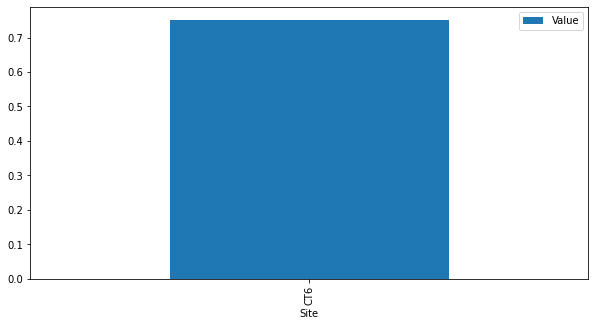

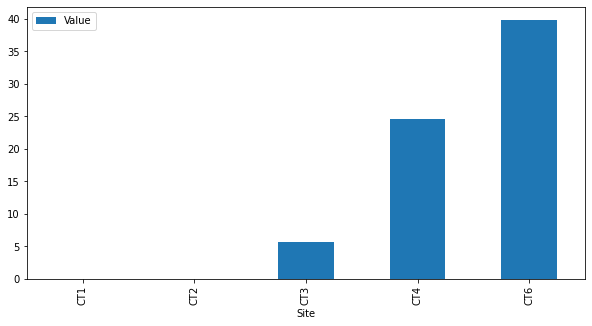

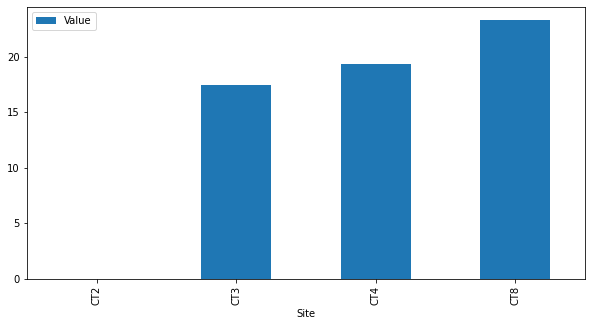

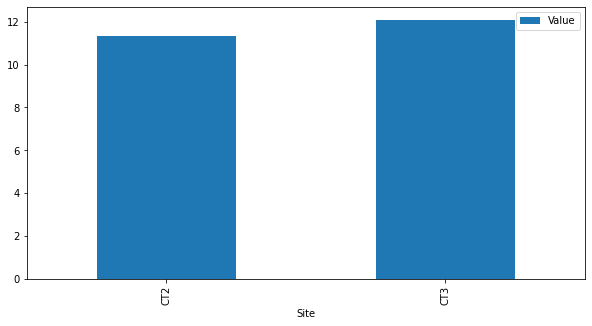

In [ ]:
grp = df_co.groupby(["Site"]).mean()["Value"].to_frame()
grp.plot.bar(figsize = (10,5))
grp = df_no.groupby(["Site"]).mean()["Value"].to_frame()
grp.plot.bar(figsize = (10,5))
grp = df_pm10.groupby(["Site"]).mean()["Value"].to_frame()
grp.plot.bar(figsize = (10,5))
grp = df_pm25.groupby(["Site"]).mean()["Value"].to_frame()
grp.plot.bar(figsize = (10,5))

#**CO** (carbon monoxide)

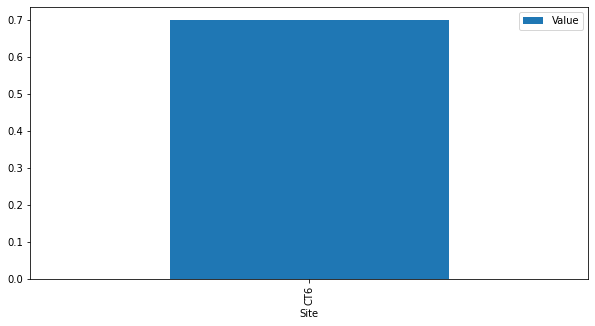

In [ ]:
df_co[['Value', 'Site']].groupby(['Site']).median().sort_values("Value", ascending = False).plot.bar(figsize=(10,5))


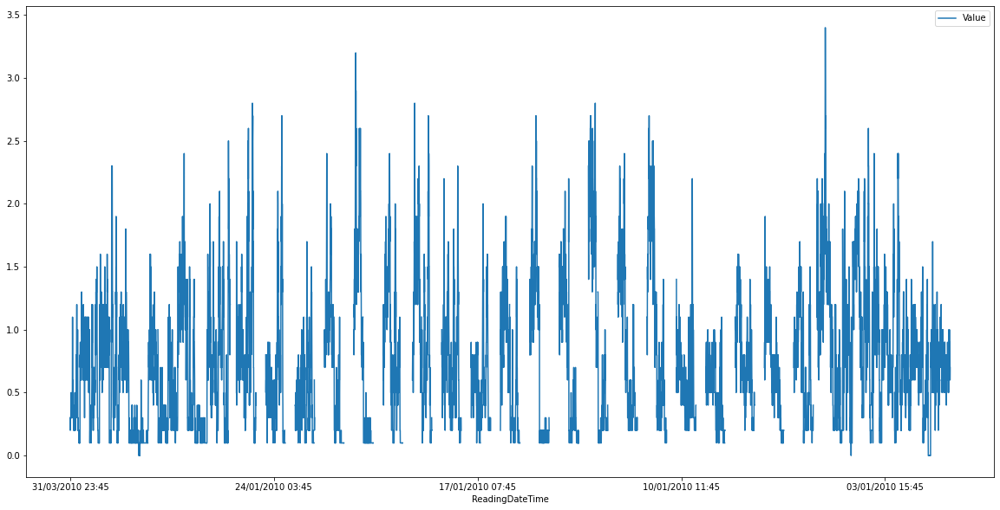

In [ ]:
df_co[['Value','ReadingDateTime','Site']].groupby(["ReadingDateTime"]).median().sort_values(by='ReadingDateTime',ascending=False).plot(figsize=(20,10))

## NO 

Nitric oxide

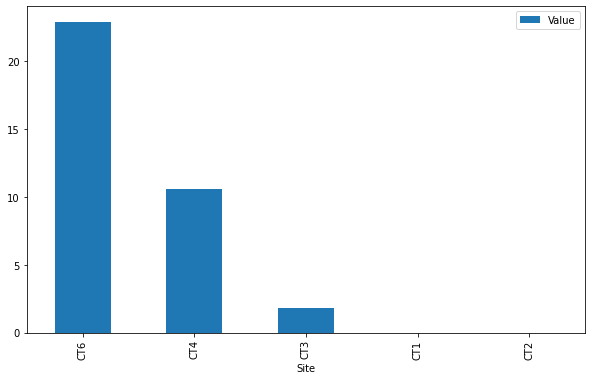

In [ ]:
df_no[['Value', 'Site']].groupby(['Site']).median().sort_values("Value", ascending = False).plot.bar(figsize=(10,6))

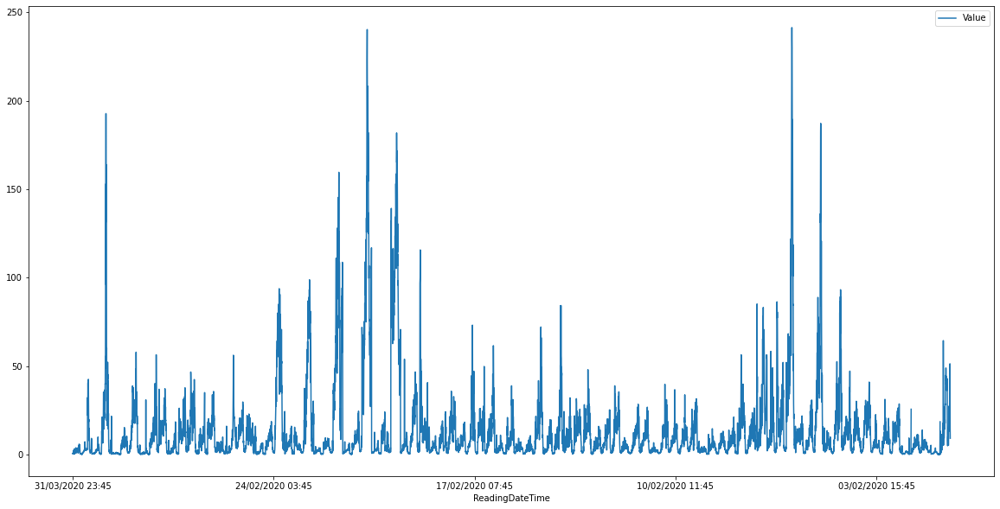

In [ ]:
df_no[['Value','ReadingDateTime','Site']].groupby(["ReadingDateTime"]).median().sort_values(by='ReadingDateTime',ascending=False).plot(figsize=(20,10))

## PM10

 Suspended Particulate Matter

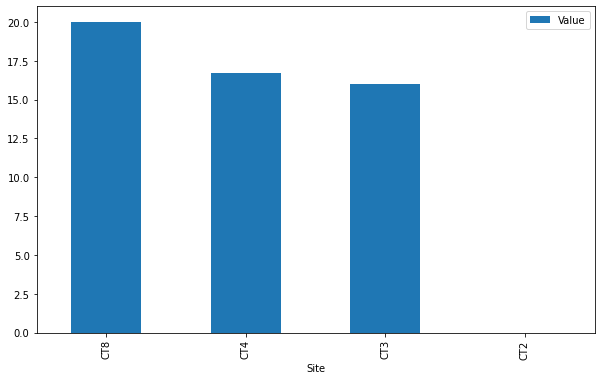

In [ ]:
df_pm10[['Value', 'Site']].groupby(['Site']).median().sort_values("Value", ascending = False).plot.bar(figsize=(10,6))

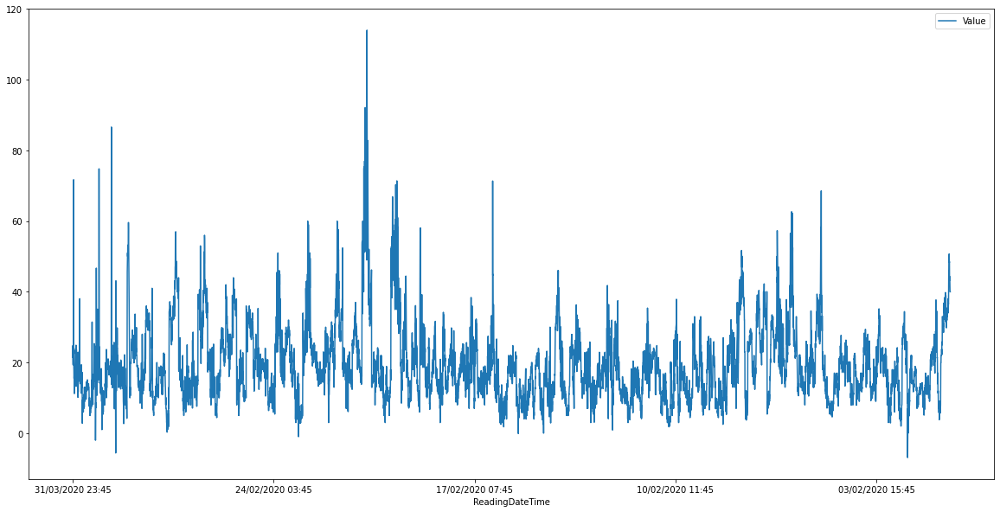

In [ ]:
df_pm10[['Value','ReadingDateTime','Site']].groupby(["ReadingDateTime"]).median().sort_values(by='ReadingDateTime',ascending=False).plot(figsize=(20,10))

## PM 2.5


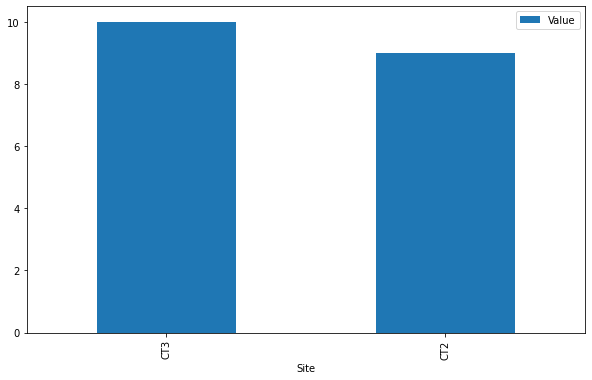

In [ ]:
df_pm25[['Value', 'Site']].groupby(['Site']).median().sort_values("Value", ascending = False).plot.bar(figsize=(10,6))

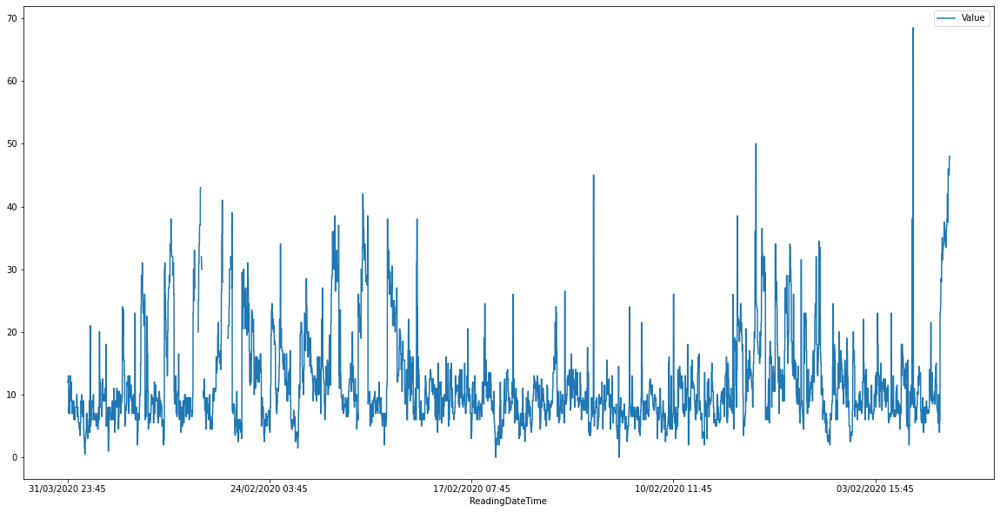

In [ ]:
df_pm25[['Value','ReadingDateTime','Site']].groupby(["ReadingDateTime"]).median().sort_values(by='ReadingDateTime',ascending=False).plot(figsize=(20,10))

## PIVOT tables

In [ ]:
df_co['ReadingDateTime'] = pd.to_datetime(df_co['ReadingDateTime']) # date parse
df_co['day'] = df_co['ReadingDateTime'].dt.day # year
df_co['day'] = df_co['day'].fillna(df_co["day"].min())
df_co['day'] = df_co['day'].values.astype(int)
df_no['ReadingDateTime'] = pd.to_datetime(df_no['ReadingDateTime']) # date parse
df_no['day'] = df_no['ReadingDateTime'].dt.day # year
df_no['day'] = df_no['day'].fillna(df_no["day"].min())
df_no['day'] = df_no['day'].values.astype(int)
df_pm10['ReadingDateTime'] = pd.to_datetime(df_pm10['ReadingDateTime']) # date parse
df_pm10['day'] = df_pm10['ReadingDateTime'].dt.day # year
df_pm10['day'] = df_pm10['day'].fillna(df_pm10["day"].min())
df_pm10['day'] = df_pm10['day'].values.astype(int)
df_pm25['ReadingDateTime'] = pd.to_datetime(df_pm25['ReadingDateTime']) # date parse
df_pm25['day'] = df_pm25['ReadingDateTime'].dt.day # year
df_pm25['day'] = df_pm25['day'].fillna(df_pm25["day"].min())
df_pm25['day'] = df_pm25['day'].values.astype(int)

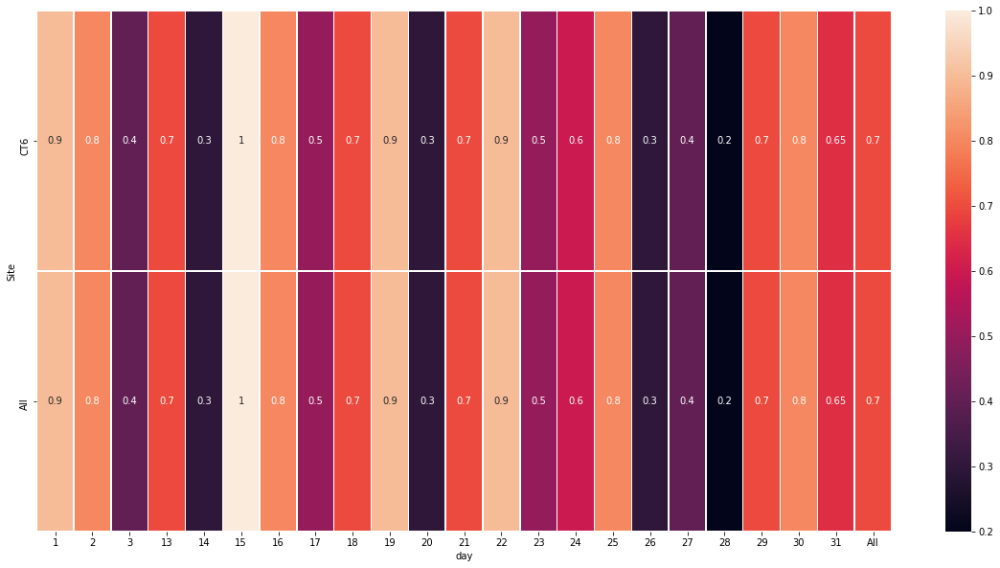

In [ ]:
# pivot tables of carbon monoxide
fig, ax = plt.subplots(figsize=(20,10))      
sns.heatmap(df_co.pivot_table('Value', index='Site',columns=['day'],aggfunc='median',margins=True),ax = ax,annot=True, linewidths=.5)

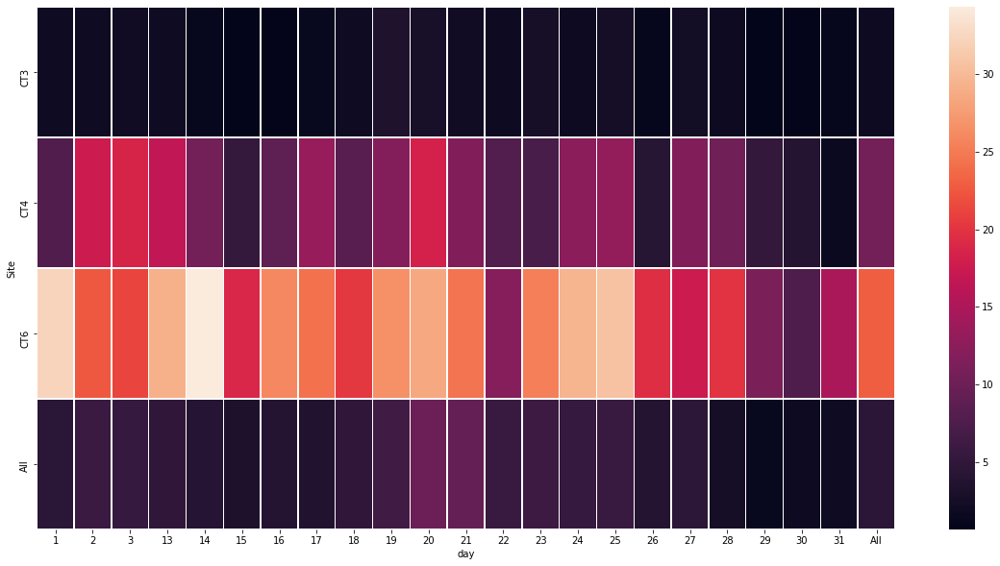

In [ ]:
#pivot table of Nitric oxide
fig, ax = plt.subplots(figsize=(20,10))      
sns.heatmap(df_no.pivot_table('Value', index='Site',columns=['day'],aggfunc='median',margins=True),ax = ax,annot=False, linewidths=.5)

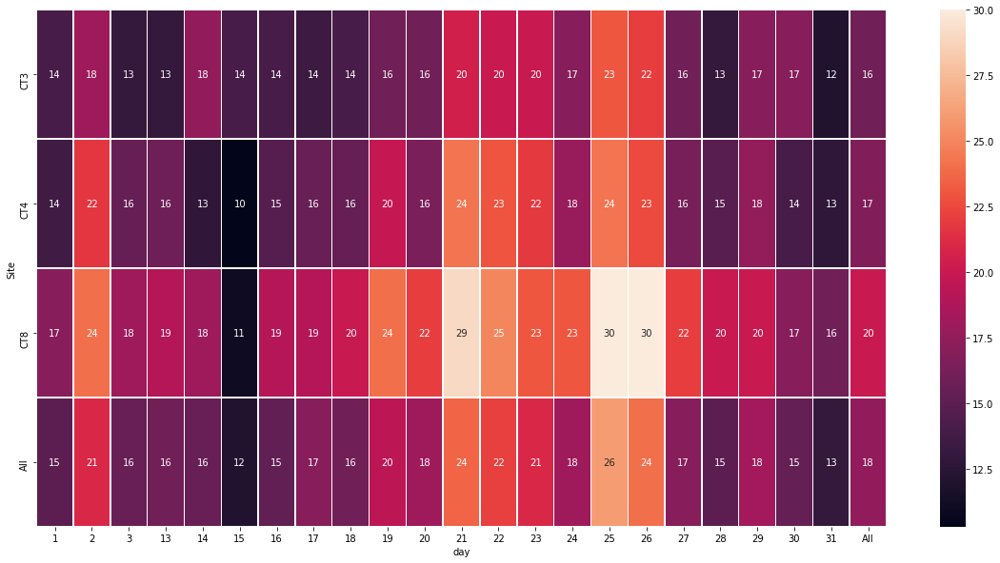

In [ ]:
#pivot tables of particular matter measured 10
fig, ax = plt.subplots(figsize=(20,10))      
sns.heatmap(df_pm10.pivot_table('Value', index='Site',columns=['day'],aggfunc='median',margins=True),ax = ax,annot=True, linewidths=.5)

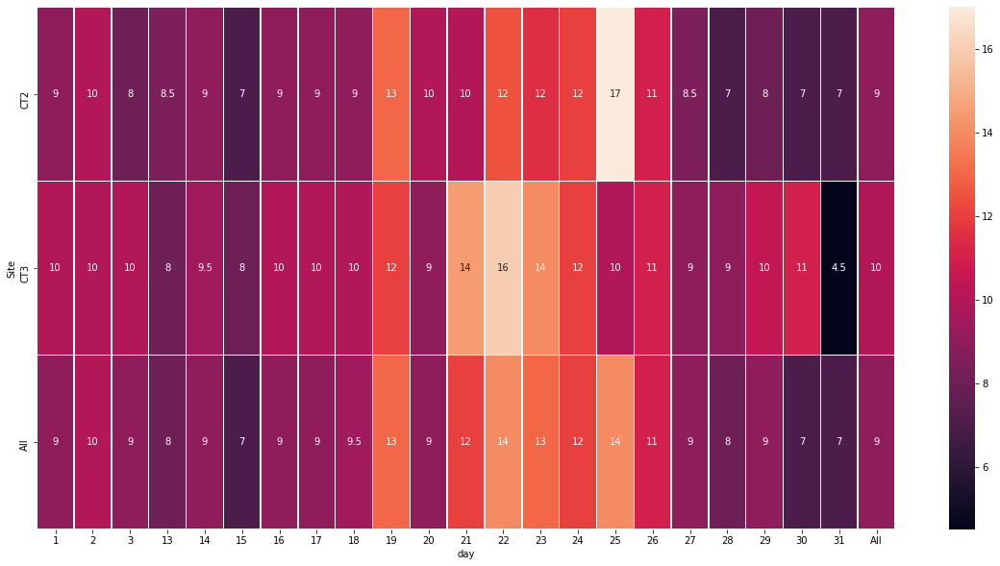

In [ ]:
#pivot table of particular matter measured 2.5
fig, ax = plt.subplots(figsize=(20,10))      
sns.heatmap(df_pm25.pivot_table('Value', index='Site',columns=['day'],aggfunc='median',margins=True),ax = ax,annot=True, linewidths=.5)

## Trends by regions

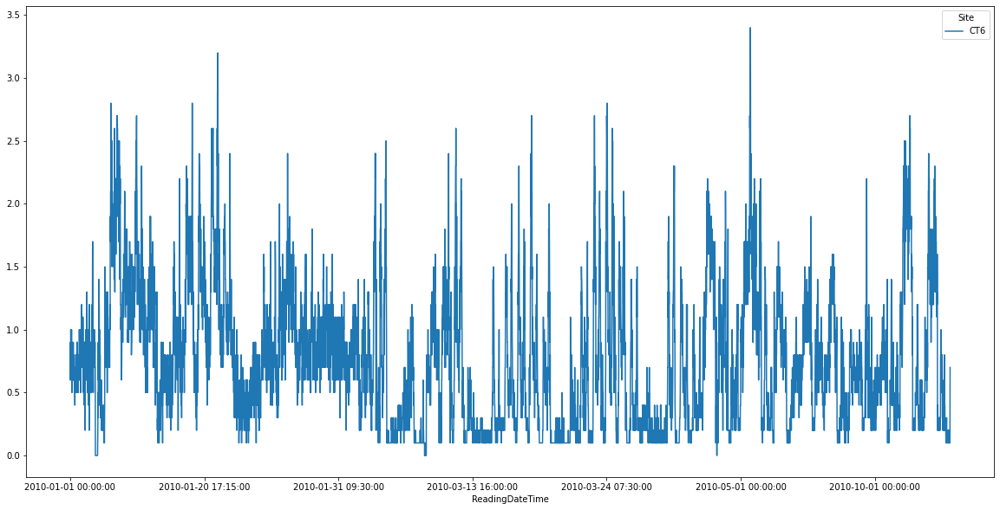

In [ ]:
temp = df_co.pivot_table('Value', index='ReadingDateTime',columns=['Site'],aggfunc='median',margins=True).reset_index()
temp = temp.drop("All", axis = 1)
temp = temp.set_index("ReadingDateTime")
temp.plot(figsize=(20,10))

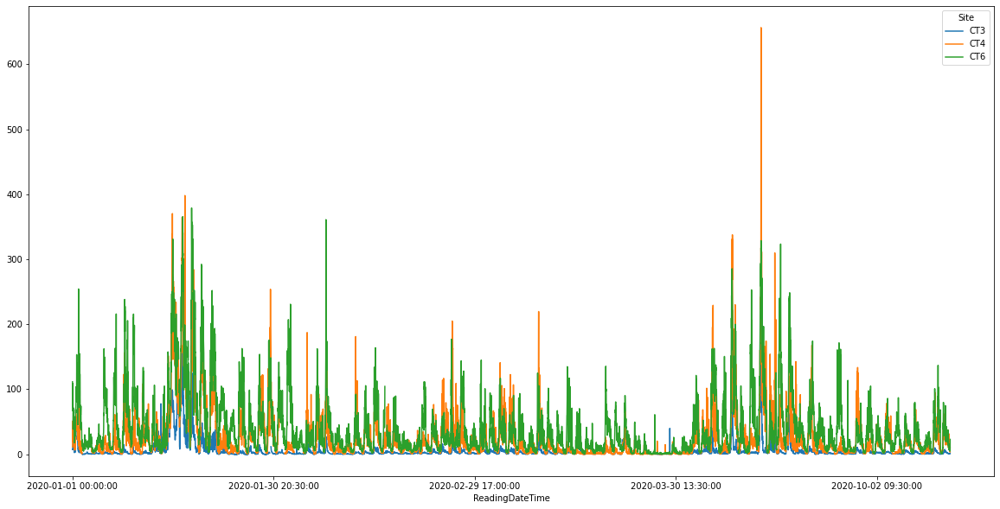

In [ ]:
temp = df_no.pivot_table('Value', index='ReadingDateTime',columns=['Site'],aggfunc='median',margins=True).reset_index()
temp = temp.drop("All", axis = 1)
temp = temp.set_index("ReadingDateTime")
temp.plot(figsize=(20,10))

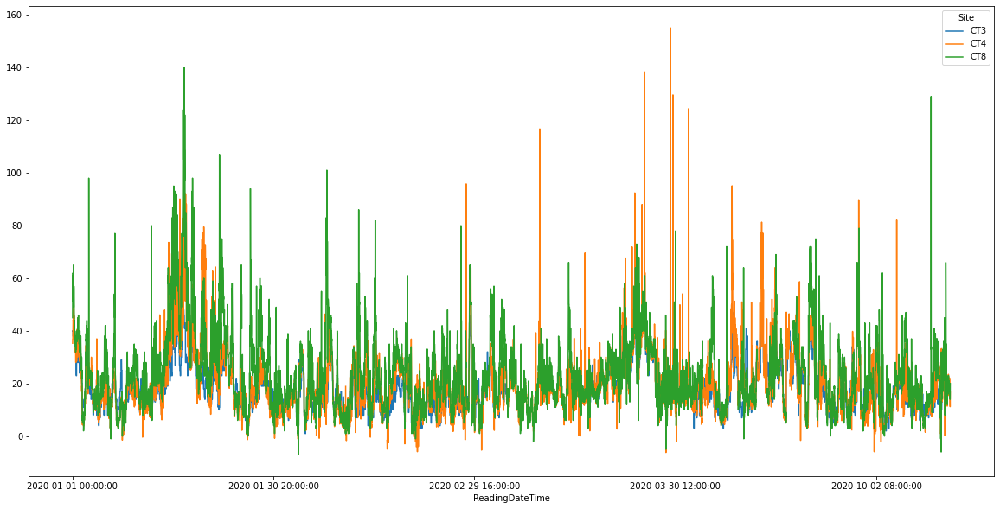

In [ ]:
temp = df_pm10.pivot_table('Value', index='ReadingDateTime',columns=['Site'],aggfunc='median',margins=True).reset_index()
temp = temp.drop("All", axis = 1)
temp = temp.set_index("ReadingDateTime")
temp.plot(figsize=(20,10))

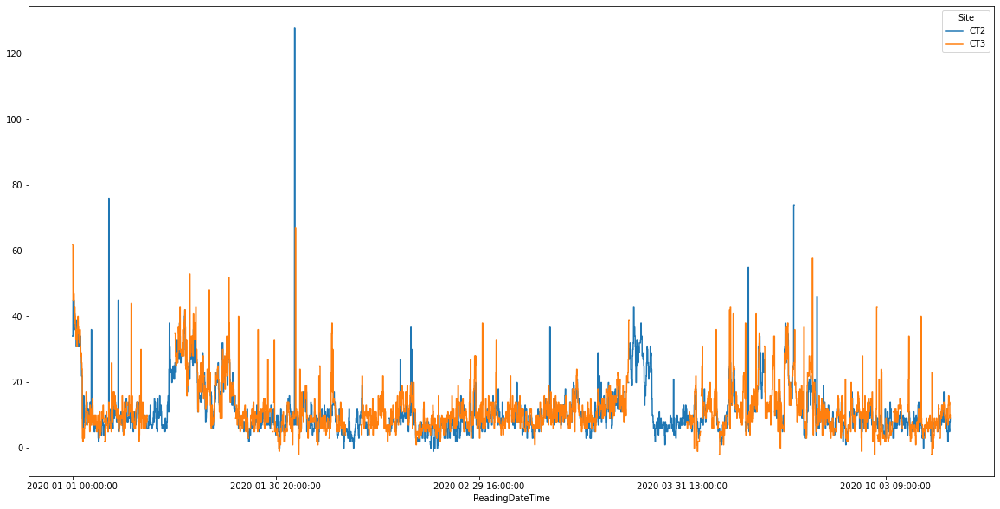

In [ ]:
temp = df_pm25.pivot_table('Value', index='ReadingDateTime',columns=['Site'],aggfunc='median',margins=True).reset_index()
temp = temp.drop("All", axis = 1)
temp = temp.set_index("ReadingDateTime")
temp.plot(figsize=(20,10))

# Time Series Analysis

* CO Carban monoxide

In [ ]:
df_co.ReadingDateTime = pd.to_datetime(df_co.ReadingDateTime)
df_aco = df_co[["ReadingDateTime", "Value"]]
df_aco = df_aco.set_index("ReadingDateTime")
df_aco = df_aco.dropna()
df_aco

,Value
ReadingDateTime,
2010-01-01 00:00:00,0.7
2010-01-01 00:15:00,0.6
2010-01-01 00:30:00,0.9
2010-01-01 01:15:00,0.7
2010-01-01 01:30:00,1.0
...,...
2010-03-31 22:45:00,0.3
2010-03-31 23:00:00,0.3
2010-03-31 23:15:00,0.3


In [ ]:
df_aco_resample = df_aco.resample(rule = "D").mean().ffill()

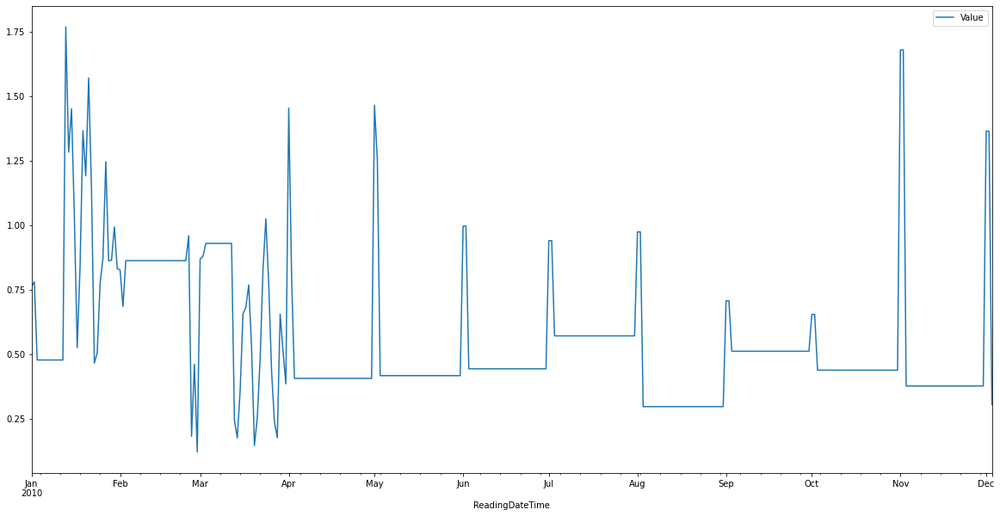

In [ ]:
df_aco_resample.plot(figsize = (20,10))

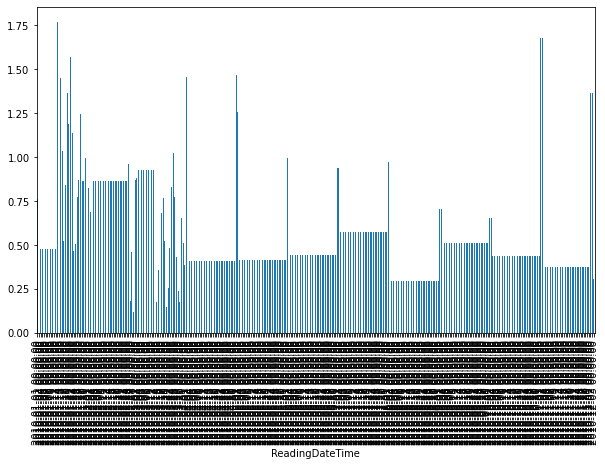

In [ ]:
df_aco_resample["Value"].resample("D").mean().plot.bar(figsize = (10,6))

### ETS Decomposition (Error Trend Seasonality)

* Simple Moving Average

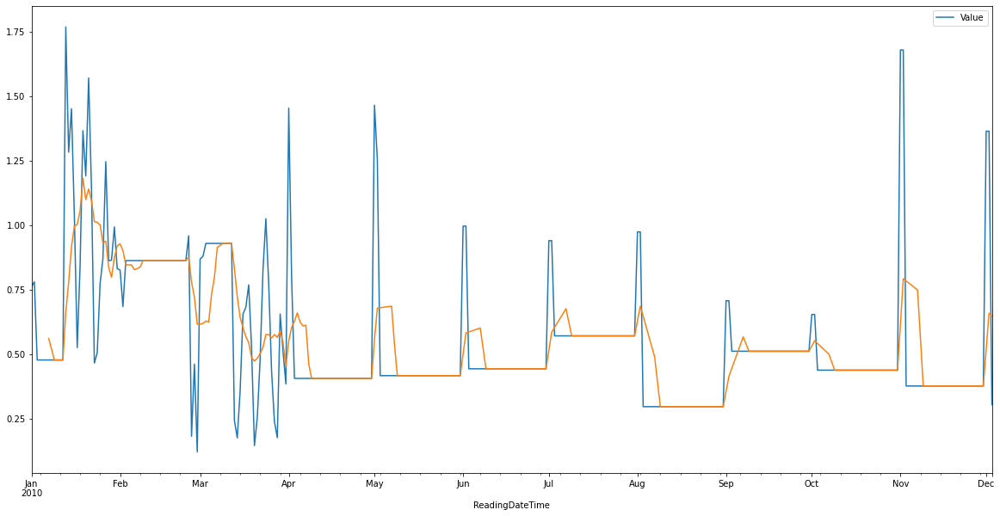

In [ ]:
df_aco_resample.plot(figsize = (20,10))
df_aco_resample.rolling(window = 7).mean()["Value"].plot(figsize = (20,10))

* Esponential weighted moving average EWMA
apply more weight to value more recent

In [ ]:
df_aco_resample["EWMA-7"] = df_aco_resample["Value"].ewm(span=7).mean()

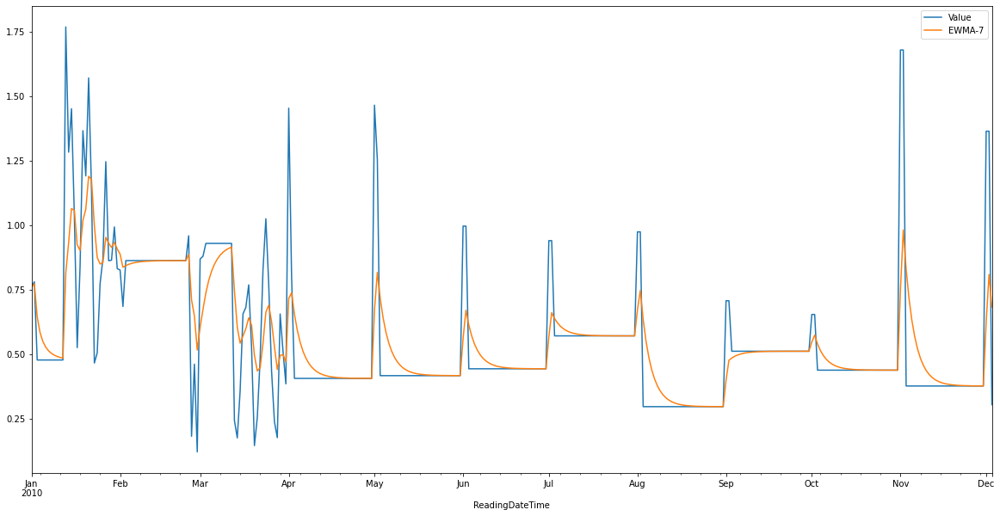

In [ ]:
df_aco_resample.plot(figsize = (20,10))

### ETS



In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(df_aco_resample["Value"], model = "multiplicative") 

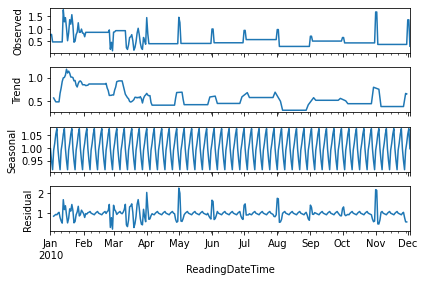

In [ ]:
fig = result.plot()

## ARIMA and Seasonal ARIMA

#### Autoregressive Integrated Moving Averages

* Make the time series data stationary
* Plot the Correlation and AutoCorrelation Charts
* Construct the ARIMA Model
* Use the model to make predictions

#### Testing the Stationarity

Basically, we are trying to whether to accept the Null Hypothesis **H0** (that the time series has a unit root, indicating it is non-stationary) or reject **H0** and go with the Alternative Hypothesis (that the time series has no unit root and is stationary).

We end up deciding this based on the p-value return.

* A small p-value (typically ≤ 0.05) indicates strong evidence against the null hypothesis, so you reject the null hypothesis.

* A large p-value (> 0.05) indicates weak evidence against the null hypothesis, so you fail to reject the null hypothesis.



In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(df_aco_resample["Value"])
print('Augmented Dickey-Fuller Test:')
labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']

for value,label in zip(result,labels):
    print(label+' : '+str(value) )
    
if result[1] <= 0.05:
    print("strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
else:
    print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

Augmented Dickey-Fuller Test:
ADF Test Statistic : -3.2712048275659806
p-value : 0.01621572016880519
#Lags Used : 7
Number of Observations Used : 329
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


* the data is seasonal ---> use Seasonal ARIMA

In [ ]:
df_aco_resample["CO_first_diff"] = df_aco_resample["Value"] - df_aco_resample["Value"].shift(7)
# CHECK
result = adfuller(df_aco_resample["CO_first_diff"].dropna() )
print('Augmented Dickey-Fuller Test:')
labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']

for value,label in zip(result,labels):
    print(label+' : '+str(value) )
    
if result[1] <= 0.05:
    print("strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
else:
    print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

Augmented Dickey-Fuller Test:
ADF Test Statistic : -6.018594749736831
p-value : 1.5126640203114207e-07
#Lags Used : 14
Number of Observations Used : 315
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


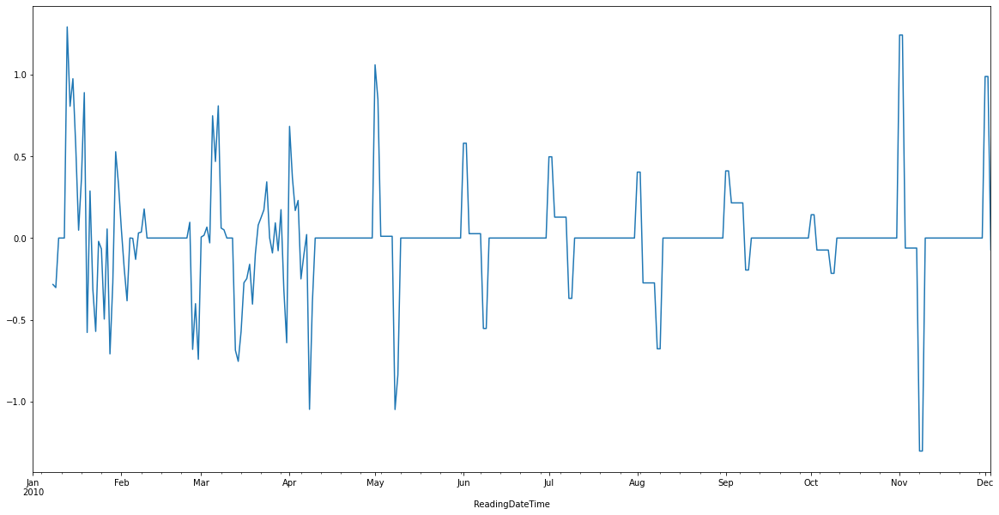

In [ ]:
df_aco_resample["CO_first_diff"].plot(figsize = (20,10))

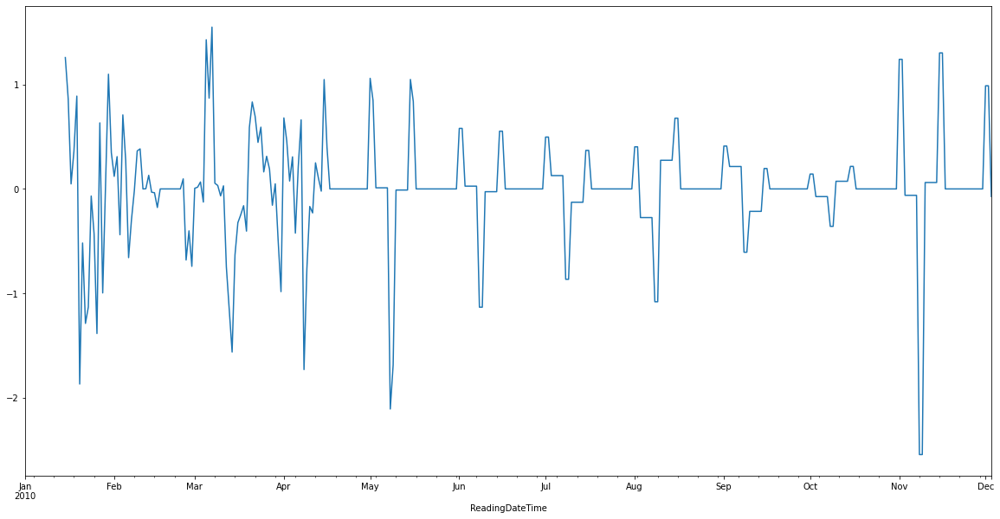

In [ ]:
df_aco_resample["CO_second_diff"] = df_aco_resample["CO_first_diff"] - df_aco_resample["CO_first_diff"].shift(7)
df_aco_resample["CO_second_diff"].plot(figsize = (20,10))

## Using the Seasonal ARIMA model

                                 Statespace Model Results                                 
Dep. Variable:                              Value   No. Observations:                  337
Model:             SARIMAX(0, 1, 0)x(1, 1, 1, 12)   Log Likelihood                  -7.368
Date:                            Fri, 24 Jul 2020   AIC                             20.736
Time:                                    19:25:41   BIC                             32.079
Sample:                                01-01-2010   HQIC                            25.264
                                     - 12-03-2010                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.0568      0.069     -0.823      0.410      -0.192       0.079
ma.S.L12      -0.8872      0.050   

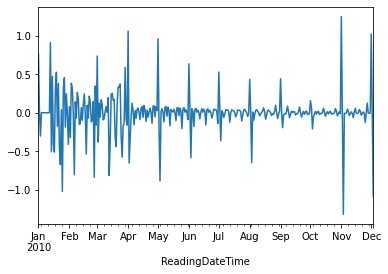

In [ ]:
import statsmodels.api as sm

model = sm.tsa.statespace.SARIMAX(df_aco_resample["Value"],order=(0,1,0), seasonal_order=(1,1,1,12))
results = model.fit()
print(results.summary())
results.resid.plot()

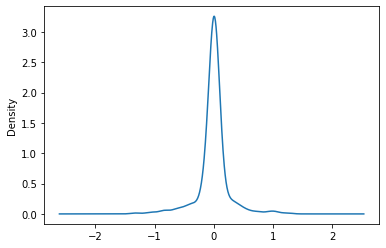

In [ ]:
results.resid.plot(kind='kde')

#### Check with known data 

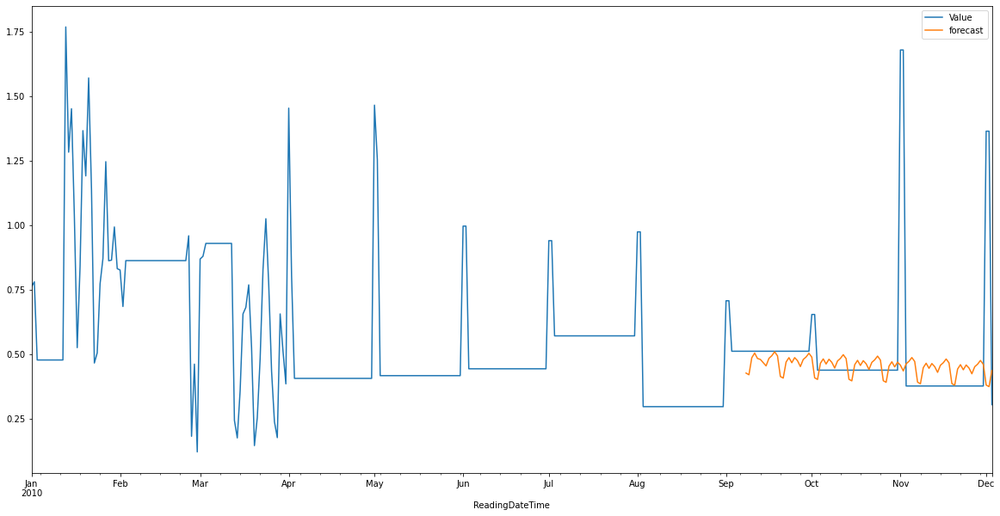

In [ ]:
df_aco_resample['forecast'] = results.predict(start = 250, end= 400, dynamic= True)  
df_aco_resample[['Value','forecast']].plot(figsize=(20,10))

## Forecast

* CO

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/kalman_filter.py:1960: ValueWarning:

Dynamic prediction specified to begin during out-of-sample forecasting period, and so has no effect.



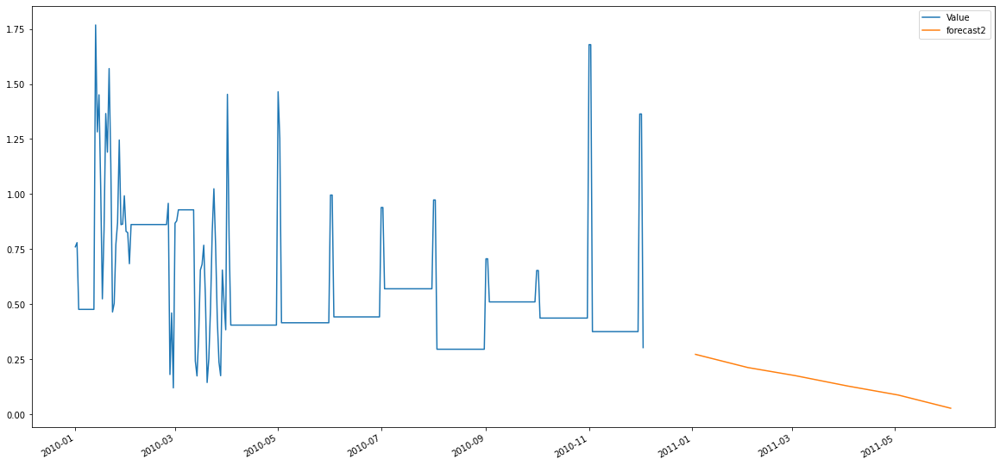

In [ ]:
from pandas.tseries.offsets import DateOffset
future_dates = [df_aco_resample.index[-1] + DateOffset(months=x) for x in range(0,24) ]
future_dates_df = pd.DataFrame(index=future_dates[1:],columns=df_aco_resample.columns)
future_df = pd.concat([df_aco_resample,future_dates_df])
future_df['forecast2'] = results.predict(start = 348, end = 540, dynamic= True)  
future_df[['Value', 'forecast2']].plot(figsize=(20, 10)) 